# Suite2p

kbarber: mk303 2025-02-10

In [3]:
%load_ext autoreload
%autoreload 2
    
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
import suite2p
import mbo_utilities as mbo
from copy import deepcopy
import lbm_suite2p_python as lsp

import matplotlib as mpl
mpl.rcParams.update({
    'axes.spines.left': True,
    'axes.spines.bottom': True,
    'axes.spines.top': False,
    'axes.spines.right': False,
    'legend.frameon': False,
    'figure.subplot.wspace': .01,
    'figure.subplot.hspace': .01,
    'figure.figsize': (18, 13),
    'ytick.major.left': True,
})
jet = mpl.cm.get_cmap('jet')
jet.set_bad(color='k')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Assembly

In [2]:
scan = mbo.read_scan(r"D:\W2_DATA\kbarber\2025-02-10\mk303\green\*", join_contiguous=True)

In [4]:
save_path = Path(r"D:\W2_DATA\kbarber\2025-02-10\mk303\assembled")  # where the z-plane tiff files live

if not [x for x in save_path.glob('*.tif*')]:
    mbo.save_as(scan, save_path, append_str='_demo',overwrite=True)

In [5]:
files = mbo.get_files(save_path, str_contains='tif', max_depth=3)
files = [Path(x) for x in files]
files[:3]

[WindowsPath('D:/W2_DATA/kbarber/2025-02-10/mk303/assembled/plane_01_demo.tiff'),
 WindowsPath('D:/W2_DATA/kbarber/2025-02-10/mk303/assembled/plane_02_demo.tiff'),
 WindowsPath('D:/W2_DATA/kbarber/2025-02-10/mk303/assembled/plane_03_demo.tiff')]

In [4]:
metadata = mbo.get_metadata(files[0])
ops = suite2p.default_ops()
ops = mbo.params_from_metadata(metadata, ops)

Ops provided. Setting pipeline to suite2p


## setup filepaths for suite2p

In [ ]:
for file in files:
    opsEnd=suite2p.run_s2p(ops=ops,db={'data_path': [str(file.parent)]})

{'data_path': ['D:\\W2_DATA\\kbarber\\2025-02-10\\mk303\\assembled']}
<class 'int'>
tif
** Found 14 tifs - converting to binary **
NOTE: ScanImageTiffReader not working for this tiff type, using tifffile
2000 frames of binary, time 5.02 sec.
4000 frames of binary, time 6.20 sec.
6000 frames of binary, time 7.41 sec.
8000 frames of binary, time 8.62 sec.
10000 frames of binary, time 9.83 sec.
12000 frames of binary, time 11.08 sec.


In [6]:
ops_files = mbo.get_files(save_path.parent, 'ops', 4)
ops_files[:3]

['D:\\W2_DATA\\kbarber\\2025-02-10\\mk303\\results\\plane_01_demo\\plane0\\ops.npy',
 'D:\\W2_DATA\\kbarber\\2025-02-10\\mk303\\results\\plane_02_demo\\plane0\\ops.npy',
 'D:\\W2_DATA\\kbarber\\2025-02-10\\mk303\\results\\plane_03_demo\\plane0\\ops.npy']

In [11]:
ps = lsp.get_zplane_stats(ops_files)

'D:\\W2_DATA\\kbarber\\2025-02-10\\mk303\\results\\volume_stats.npy'

In [32]:
ops = np.load(ops_files[0], allow_pickle=True).item()
stats_file = Path(ops['save_path']).joinpath('stat.npy')

In [33]:
iscell = np.load(Path(ops['save_path']).joinpath('iscell.npy'), allow_pickle=True)[:, 0].astype(bool)
stats = np.load(stats_file, allow_pickle=True)
stats.shape, iscell.shape

((601,), (601,))

In [34]:
f_cells = np.load(Path(ops['save_path']).joinpath('F.npy'))
f_neuropils = np.load(Path(ops['save_path']).joinpath('Fneu.npy'))
spks = np.load(Path(ops['save_path']).joinpath('spks.npy'))
f_cells.shape, f_neuropils.shape, spks.shape

((601, 52628), (601, 52628), (601, 52628))

dict_keys(['ypix', 'xpix', 'lam', 'med', 'footprint', 'mrs', 'mrs0', 'compact', 'solidity', 'npix', 'npix_soma', 'soma_crop', 'overlap', 'radius', 'aspect_ratio', 'npix_norm_no_crop', 'npix_norm', 'skew', 'std', 'neuropil_mask'])


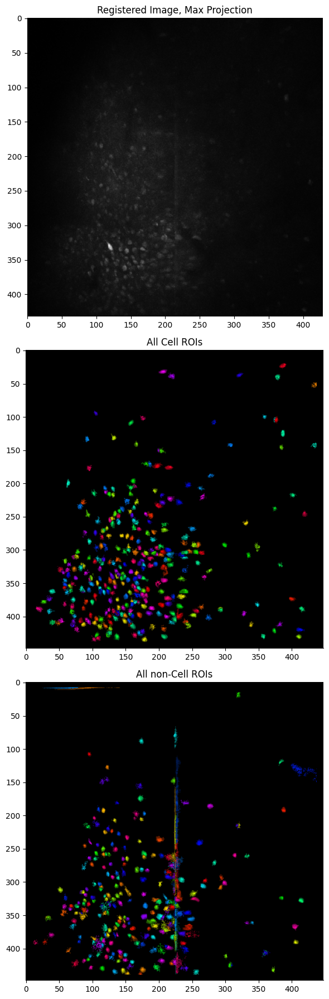

In [46]:
Lx = ops["Lx"]
Ly = ops["Ly"]

n_cells = len(stats)

h = np.random.rand(n_cells)
hsvs = np.zeros((2, Ly, Lx, 3), dtype=np.float32)

for i, stat in enumerate(stats):
    ypix, xpix, lam = stat['ypix'], stat['xpix'], stat['lam']
    hsvs[iscell[i], ypix, xpix, 0] = h[i]
    hsvs[iscell[i], ypix, xpix, 1] = 1
    hsvs[iscell[i], ypix, xpix, 2] = lam / lam.max()

from colorsys import hsv_to_rgb
rgbs = np.array([hsv_to_rgb(*hsv) for hsv in hsvs.reshape(-1, 3)]).reshape(hsvs.shape)

plt.figure(figsize=(18,18))
plt.subplot(3, 1, 1)
plt.imshow(ops['max_proj'], cmap='gray')
plt.title("Registered Image, Max Projection")

plt.subplot(3, 1, 2)
plt.imshow(rgbs[1])
plt.title("All Cell ROIs")

plt.subplot(3, 1, 3)
plt.imshow(rgbs[0])
plt.title("All non-Cell ROIs");

plt.tight_layout()

In [64]:
import numpy as np
import matplotlib.pyplot as plt
from colorsys import hsv_to_rgb

def plot_roi_maps(ops_list):
    """Generates a 3-row x len(ops_list)-column plot of max projection and ROI maps for multiple ops files."""
    
    n_ops = len(ops_list)  # Number of columns

    fig, axes = plt.subplots(3, n_ops, figsize=(6 * n_ops, 18))  # 3 rows, n_ops cols

    for idx, ops in enumerate(ops_list):
        if isinstance(ops, str):
            ops = np.load(ops, allow_pickle=True).item()
            
        stats_file = Path(ops['save_path']).joinpath('stat.npy')
        iscell = np.load(Path(ops['save_path']).joinpath('iscell.npy'), allow_pickle=True)[:, 0].astype(int)
        stats = np.load(stats_file, allow_pickle=True)
        
        Lx, Ly = ops["Lx"], ops["Ly"]
        n_cells = len(stats)

        # Generate HSV colormap for ROIs
        h = np.random.rand(n_cells)
        hsvs = np.zeros((2, Ly, Lx, 3), dtype=np.float32)

        for i, stat in enumerate(stats):
            ypix, xpix, lam = stat['ypix'], stat['xpix'], stat['lam']
            hsvs[iscell[i], ypix, xpix, 0] = h[i]
            hsvs[iscell[i], ypix, xpix, 1] = 1
            hsvs[iscell[i], ypix, xpix, 2] = lam / lam.max()

        # Convert HSV to RGB
        rgbs = np.array([hsv_to_rgb(*hsv) for hsv in hsvs.reshape(-1, 3)]).reshape(hsvs.shape)

        # Plot Max Projection (First Row)
        ax = axes[0, idx]
        ax.imshow(ops['max_proj'], cmap='gray')
        if idx == 0:
            ax.set_ylabel("Max Projection", fontsize=14, fontweight="bold")
        ax.set_xticks([])
        ax.set_yticks([])
        
        # Plot All Cell ROIs (Second Row)
        ax = axes[1, idx]
        ax.imshow(rgbs[1])
        if idx == 0:
            ax.set_ylabel("All Cell ROIs", fontsize=14, fontweight="bold")
        ax.set_xticks([])
        ax.set_yticks([])

        # Plot All Non-Cell ROIs (Third Row)
        ax = axes[2, idx]
        ax.imshow(rgbs[0])
        if idx == 0:
            ax.set_ylabel("All Non-Cell ROIs", fontsize=14, fontweight="bold")
        ax.set_xticks([])
        ax.set_yticks([])

        # Column Titles
        axes[0, idx].set_title(f"Ops {idx+1}", fontsize=14, fontweight="bold")

    plt.savefig('./test.png', dpi=600)


# Example usage:
# ops_list = [ops1, ops2, ops3]  # List of ops dictionaries
# stats_list = [stats1, stats2, stats3]  # Corresponding stats lists
# iscell_list = [iscell1, iscell2, iscell3]  # Corresponding iscell lists
# plot_roi_maps(ops_list, stats_list, iscell_list)


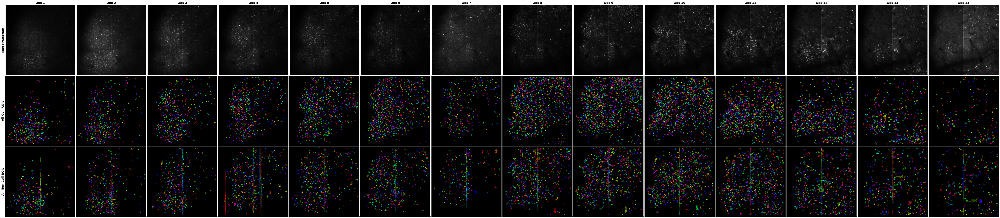

In [65]:
plot_roi_maps(ops_files)

In [75]:
iscell.shape
stats.shape

(601,)

In [57]:
cell_list = []
for ops_file in ops_files:
    ops_file = np.load(ops_file, allow_pickle=True).item()
    cell_list.append(np.load(Path(ops_file['save_path']).joinpath('iscell.npy'), allow_pickle=True)[:, 0].astype(int))

In [58]:
stat_files = mbo.get_files(save_path.parent, 'stat.npy', max_depth=5)

In [ ]:
plot_roi_maps(ops_files, stat_files, iscell_list)

In [41]:
ops1 = np.load(save_path.parent.joinpath("results", "plane_07_demo", "plane0", "ops.npy"), allow_pickle=True).item()

## Testing some stuff

In [119]:
f_cells = np.load(Path(ops['save_path']).joinpath('F.npy'))
f_neuropils = np.load(Path(ops['save_path']).joinpath('Fneu.npy'))
spks = np.load(Path(ops['save_path']).joinpath('spks.npy'))
f_cells.shape, f_neuropils.shape, spks.shape

((601, 52628), (601, 52628), (601, 52628))

In [125]:
f_cells_list = []
for ops in ops_files:
    ops = np.load(ops, allow_pickle=True).item()
    
    f_cells = np.load(Path(ops['save_path']).joinpath('F.npy'))
    # f_neuropils = np.load(Path(ops['save_path']).joinpath('Fneu.npy'))
    # spks = np.load(Path(ops['save_path']).joinpath('spks.npy'))
    f_cells_list.append(f_cells)

In [156]:
def get_fcells_from_ops_list(ops_list):
    f_cells_list = []
    for ops in ops_list:
        ops = np.load(ops, allow_pickle=True).item()
        f_cells = np.load(Path(ops['save_path']).joinpath('F.npy'))
        print(f_cells.shape)
        f_cells_list.append(f_cells)
    return f_cells_list

In [157]:
f_cells = get_fcells_from_ops_list(ops_files)

(601, 52628)
(709, 52628)
(840, 52628)
(937, 52628)
(1163, 52628)
(1306, 52628)
(537, 52628)
(1572, 52628)
(1697, 52628)
(1678, 52628)
(1598, 52628)
(1128, 52628)
(730, 52628)
(398, 52628)


AttributeError: 'list' object has no attribute 'shape'

In [114]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore

def plot_fluorescence_heatmap(f_cells, roi_range=(0, 500), frame_range=(0, 1000), sorted=False):
    
    subset = f_cells[roi_range[0]:roi_range[1], frame_range[0]:frame_range[1]]
    subset_zscore = zscore(subset, axis=1, nan_policy='omit')  # Normalize each ROI independently

    if sorted:
        sorted_indices = np.argsort(np.max(subset_zscore, axis=1))[::-1]  # Sort by peak Z-score
        subset_zscore = subset_zscore[sorted_indices]
        
    
    plt.figure(figsize=(12, 6))
    sns.heatmap(subset_zscore, cmap="inferno", center=0, cbar=True)

    # Labels and styling
    plt.xlabel(f"Frame ({frame_range[0]}-{frame_range[1]})", fontsize=14, fontweight="bold")
    plt.ylabel(f"ROI ({roi_range[0]}-{roi_range[1]})", fontsize=14, fontweight="bold")
    title = "Fluorescence Traces (Z-Score Normalized Heatmap)"
    if sorted:
        title = title + " sorted"
    plt.title(title, fontsize=16, fontweight="bold")

    plt.show()

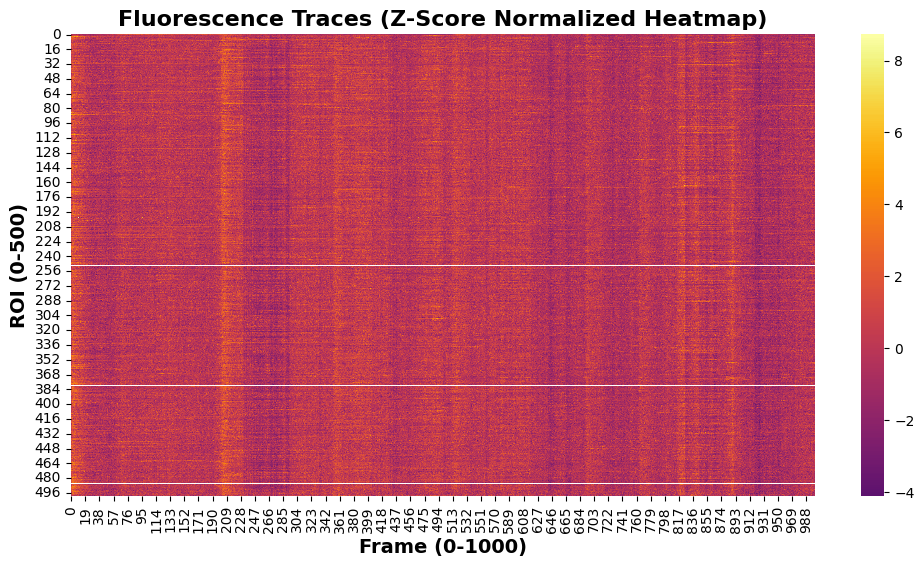

In [117]:
plot_fluorescence_heatmap(f_cells, sorted=False)

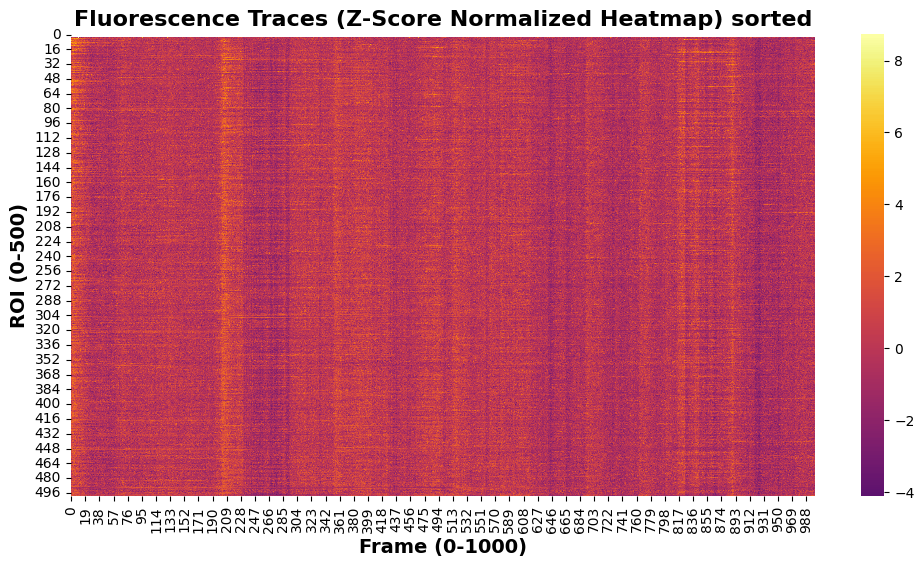

In [116]:
plot_fluorescence_heatmap(f_cells, sorted=True)

In [146]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore
import math

def plot_fluorescence_grid_auto(f_cells_list, savepath, roi_range=(0, 500), frame_range=(0, 1000), sorted=False):
    """
    Generates an auto-sized square grid plot of Z-score normalized fluorescence heatmaps for multiple f_cells.
    
    Each row represents consecutive planes (e.g., Row 1 = Planes 1-4, Row 2 = Planes 5-8, etc.).
    The background is black with white text for labels. Optionally, ROIs can be sorted by mean absolute Z-score.

    Parameters
    ----------
    f_cells_list : list of np.ndarray
        List of fluorescence traces with shape (ROIs x Frames).
    savepath : str
        Path to save the generated figure.
    roi_range : tuple of int, optional
        The range of ROIs to include in the plots (default is (0, 500)).
    frame_range : tuple of int, optional
        The range of frames to include in the plots (default is (0, 1000)).
    sorted : bool, optional
        Whether to sort ROIs by mean absolute Z-score (default is False).

    Raises
    ------
    ValueError
        If `f_cells_list` is empty.

    Notes
    -----
    The function dynamically arranges the heatmaps into a square-like grid while ensuring that each row
    is labeled with the corresponding planes it represents. Sorting (if enabled) orders ROIs in descending 
    order of mean absolute Z-score.

    """
    
    n = len(f_cells_list)
    if n == 0:
        raise ValueError("f_cells_list must contain at least one element.")

    grid_size = math.ceil(math.sqrt(n))  
    rows, cols = grid_size, grid_size if n > (grid_size - 1) * grid_size else grid_size - 1

    fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 6 * rows), facecolor="black")
    axes = np.array(axes).reshape(-1)

    for idx, f_cells in enumerate(f_cells_list):
        ax = axes[idx]  

        subset = f_cells[roi_range[0]:roi_range[1], frame_range[0]:frame_range[1]]
        subset_zscore = zscore(subset, axis=1, nan_policy='omit')

        if sorted:
            sorted_indices = np.argsort(np.mean(np.abs(subset_zscore), axis=1))[::-1]
            subset_zscore = subset_zscore[sorted_indices]

        sns.heatmap(subset_zscore, cmap="inferno", center=0, cbar=False, ax=ax)

        if idx % cols == 0:
            plane_start = idx + 1
            plane_end = min(idx + cols, n) 
            ax.set_ylabel(f"Planes {plane_start}-{plane_end}", fontsize=24, fontweight="bold", color="white")

        ax.set_facecolor("black")
        ax.spines["bottom"].set_color("white")
        ax.spines["top"].set_color("white")
        ax.spines["left"].set_color("white")
        ax.spines["right"].set_color("white")

        ax.set_xticks([])
        ax.set_yticks([])

    for j in range(idx + 1, rows * cols):
        fig.delaxes(axes[j])

    if sorted:
        plt.suptitle("Fluorescence Traces (Z-Scored, Sorted by Activity)", fontsize=32, fontweight="bold", color="white", y=0.92)
    else:
        plt.suptitle("Fluorescence Traces (Z-Scored)", fontsize=32, fontweight="bold", color="white", y=0.92)

    plt.figtext(0.5, 0.01, f"Frame Interval: {frame_range[0]}-{frame_range[1]}, ROI Interval: {roi_range[0]}-{roi_range[1]}",
            fontsize=24, fontweight="bold", color="white", ha="center")

    plt.subplots_adjust(hspace=0.1, wspace=0.1)

    plt.savefig(savepath, dpi=1200, bbox_inches="tight", facecolor="black")
    plt.show()

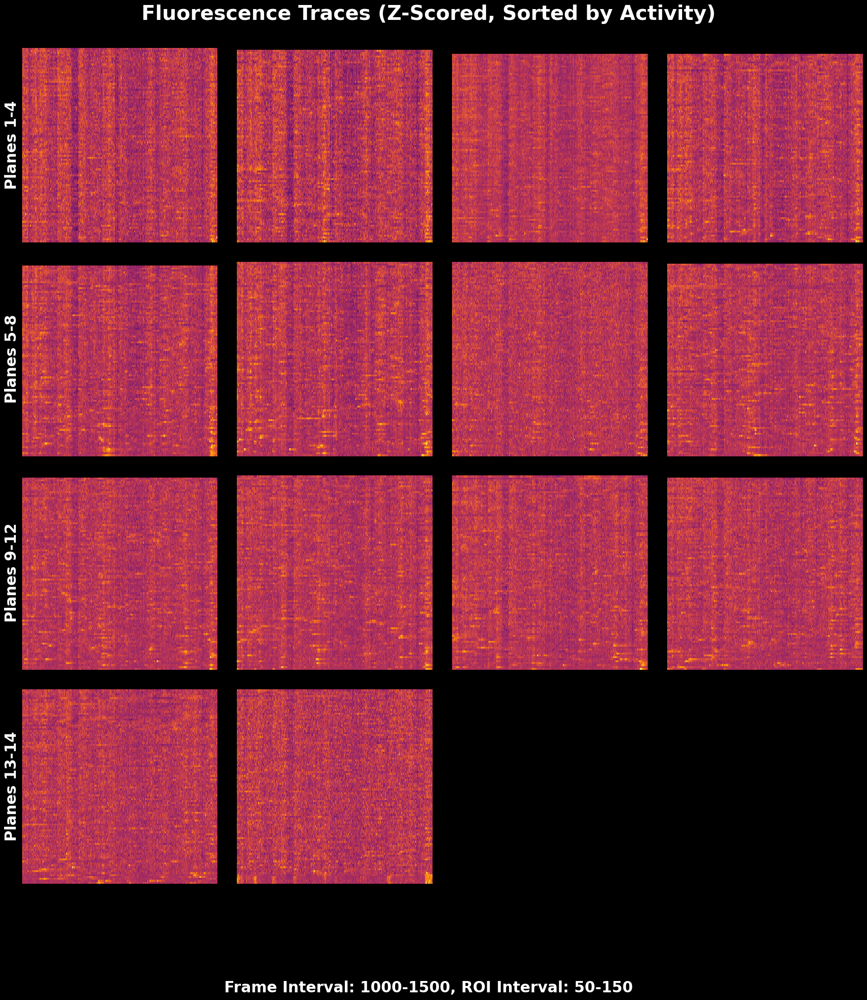

In [147]:
plot_fluorescence_grid_auto(f_cells_list, "fluorescence_grid.png", roi_range=(50, 150), frame_range=(1000, 1500), sorted=True)

In [129]:
def _quick_subsample(data, target_size=int(1e6)):
    
    step = max(1, round(data.size / target_size))
    ind = np.arange(0, data.size, step)
    multi_ind = np.unravel_index(ind, data.shape)
    data_ss = data[multi_ind]

    ds_ratio = np.array([max(1, s // (len(ind) ** (1 / len(data.shape)))) for s in data.shape])
    
    new_shape = tuple(np.maximum(1, (data.shape / ds_ratio)).astype(int))
    
    pad_size = max(0, np.prod(new_shape) - data_ss.size)
    data_ss_padded = np.pad(data_ss, (0, pad_size), mode='constant')
    data_ss_reshaped = data_ss_padded.reshape(new_shape)

    return data_ss_reshaped

In [69]:
ndims = data_ss.ndim
dims

3

In [76]:
shape = np.array(data.shape) / np.sum(data.shape)

In [87]:
max_items=1e6
dim_proportions = np.array(shape) / shape.sum()
dim_proportions

array([0.85056704, 0.07471648, 0.07471648])

In [88]:
dim_samples = np.floor(dim_proportions * max_items).astype(int)
dim_samples

array([850567,  74716,  74716])

In [92]:
dim_samples = np.minimum(dim_samples, shape)
dim_samples

array([0.85056704, 0.07471648, 0.07471648])

In [53]:
data_ss = subsample_and_reshape(data)

In [48]:
data_ss.shape

(100, 112, 112)

In [57]:
int(np.prod(data_ss.shape))

1254400